# Computer Vision 2023 Assignment 2: Image matching and retrieval

In this prac, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the prac:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly.

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called notebooktopdf.ipynb


We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, why, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory A2_smvs, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>.

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pwd
%cd drive/MyDrive/Colab\ Notebooks
!pwd

In [3]:
# Numpy is the main package for scientific computing with Python.
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)

    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img, 'gray'), plt.axis('off'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography()
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'), plt.axis('off'), plt.show()

def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epipolar lines
        img2 - image where the points are defined for visualizing epilines in image 1
        pts1, pts2 are your good matches in image 1 and 2.
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv.cvtColor(img1,cv.COLOR_GRAY2BGR)
    img2 = cv.cvtColor(img2,cv.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2


# Question 1: Matching an object in a pair of images (60%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test". Ratio test was used in SIFT to find good matches and was described in the lecture. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [5]:
# load images as grey scale
img1 = cv2.imread('a2/A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("a2/A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd

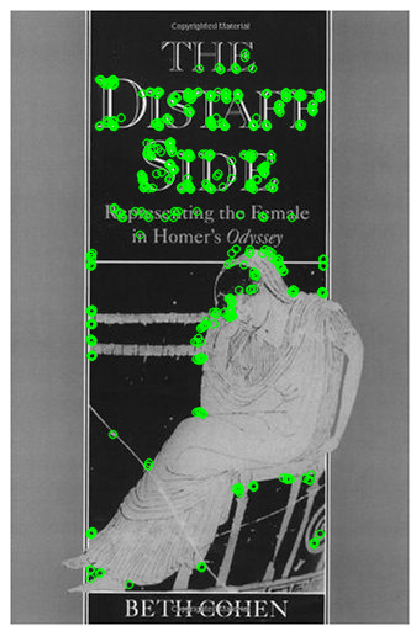

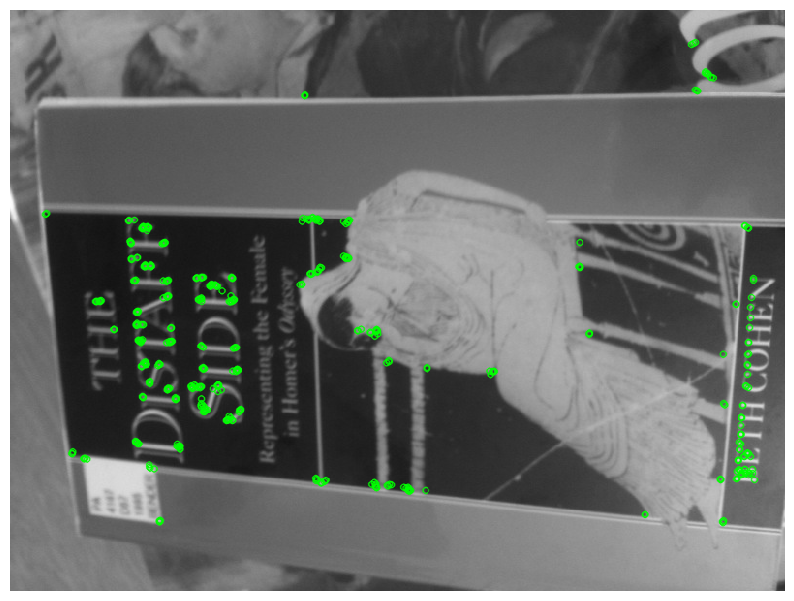

Effect of changing ratio:
Ratio: 0.6, Good matches: 38


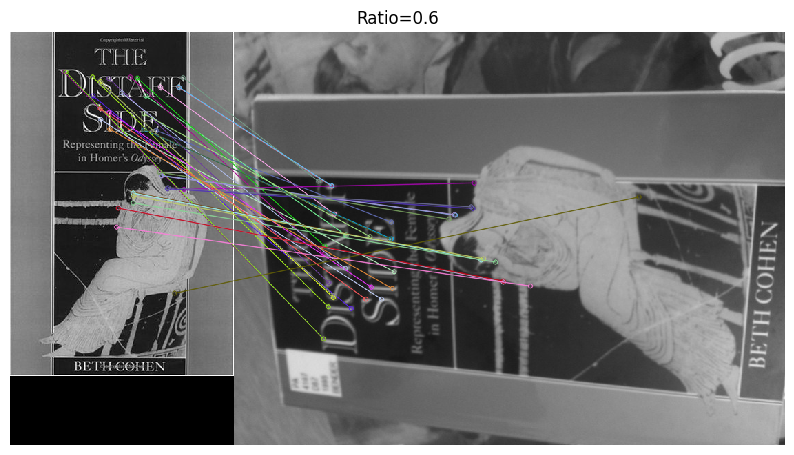

Ratio: 0.7, Good matches: 76


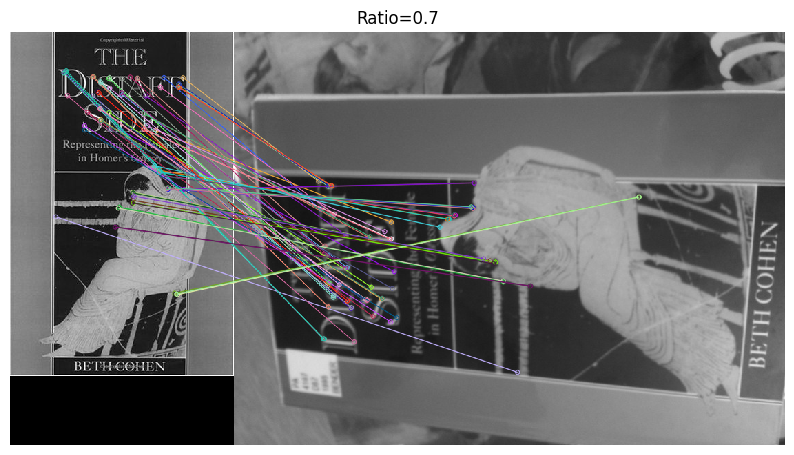

Ratio: 0.8, Good matches: 131


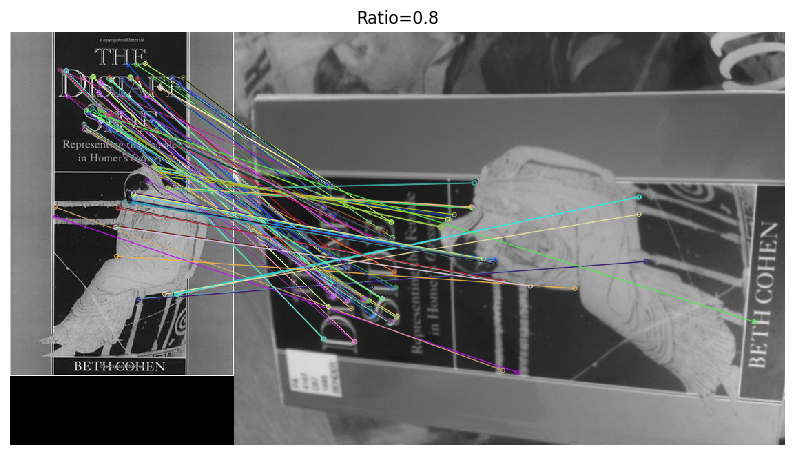

Ratio: 0.9, Good matches: 242


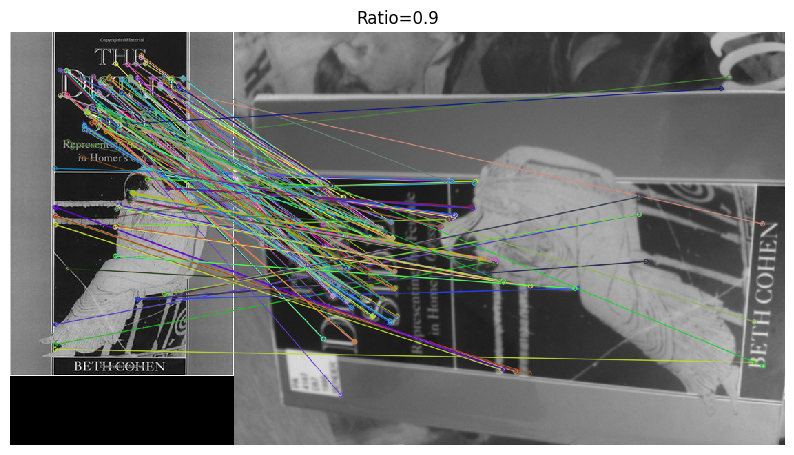

In [6]:

orb = cv2.ORB_create()

# compute detector and descriptor, see (2) above
kp1 = orb.detect(img1, None)
kp1, des1 = orb.compute(img1, kp1)

kp2 = orb.detect(img2, None)
kp2, des2 = orb.compute(img2, kp2)

# find the keypoints and descriptors with ORB, see (2) above

# draw keypoints, see (2) above
img1_kp = cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0), flags=0)
img2_kp = cv2.drawKeypoints(img2, kp2, None, color=(0, 255, 0), flags=0)

plt.imshow(img1_kp), plt.axis('off'), plt.show()
plt.imshow(img2_kp), plt.axis('off'), plt.show()

# create BFMatcher object, see (3) above
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

# Match descriptors, see (3) above
matches = bf.knnMatch(des1, des2, k=2)


# Apply ratio test, see (3) above
print("Effect of changing ratio:")
ratios = [0.6, 0.7, 0.8, 0.9]  # test different ratios
for ratio in ratios:
    good = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good.append(m)

    print(f"Ratio: {ratio}, Good matches: {len(good)}")

    # draw matches, see (4) above
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good, None, flags=2)
    plt.title(f'Ratio={ratio}')
    plt.imshow(img_matches), plt.axis('off'), plt.show()


***Your explanation of what you have done, and your results, here***

The query was successfully matched to the reference image, the keypoints are shown above matched between the images in green dots.
After the KNN matching, the ratio test was done, it was repeated at different ratios to test the effect of varying the ratio. At a ratio of 0.6, there are 38 good matches, which are displayed in the output image. At the ratio of 0.7, the good matches double to 76, and this is visualised in the image output of the inlier lines between the images, a clear increased amount of lines compared to 0.6. As the ratio increases further to 0.8 and 0.9, the good matches further increase to 131 and 242 respectively, again, the increased ratio is visualised in the ouput images as more inliers between the query and reference images. As the ratio increases, the inliers remain mostly tightly packed together, visually, this just shows as increasing more densly packed inlier lines, this is due to the fact that the matches mostly occur in the detailed parts of the book covers with clearly defined edges, here most of the matches are concentrated on the book title.

5. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

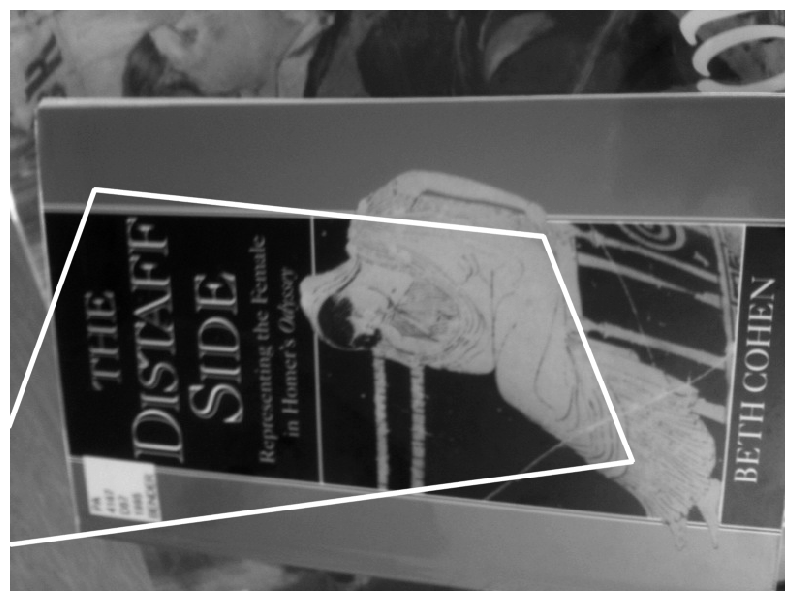

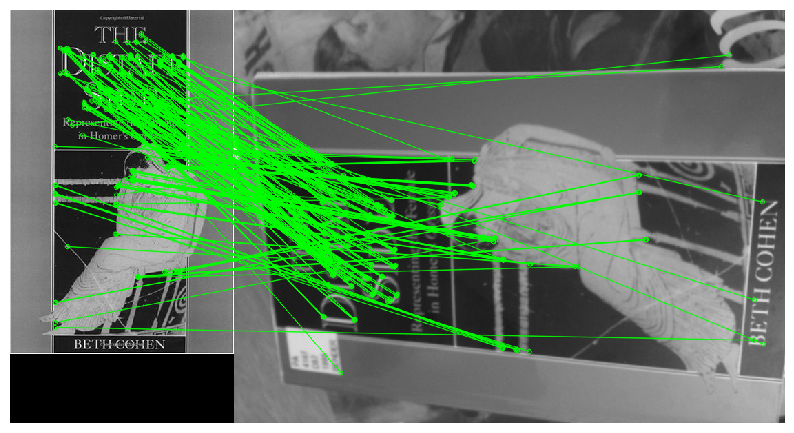

In [7]:
# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)


# using cv2 standard method, see (3) above
H, mask = cv2.findHomography(src_pts, dst_pts, 0)


# draw frame
draw_outline(img1, img2, H)


# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)



***Your explanation of results here***

Using the least squares method to estimate a homography transformation between the matches results in a very approximate outline displayed on the reference image, which surrounds where the query has been matched to the reference. The outline seems to mostly border the inliers in the reference image as visualised also above instead of the actual book cover. The result still outlines the general location of the book as it appears in the reference image, however, it does not accurately outline the book.

Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

Threshold:  1.0
Number of inliers: 41


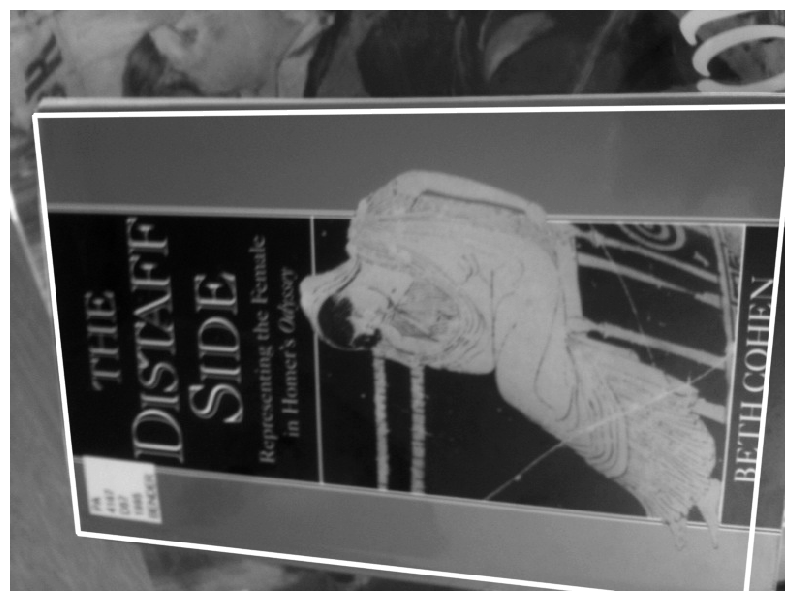

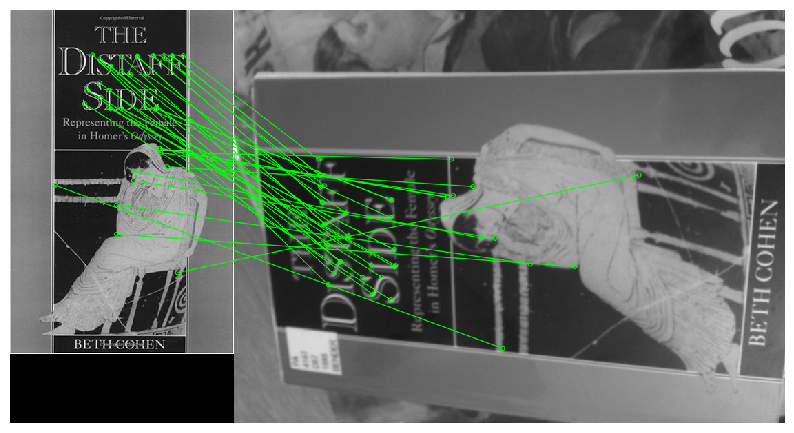


Threshold:  5.0
Number of inliers: 148


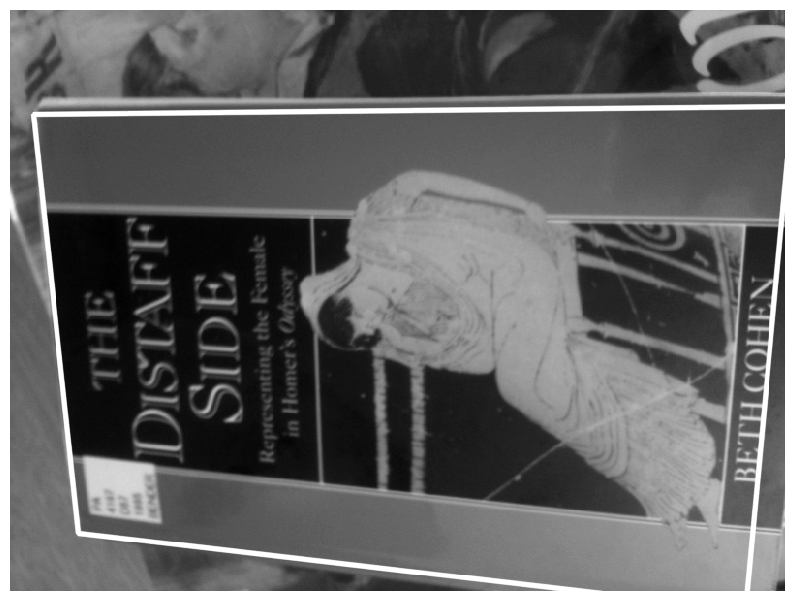

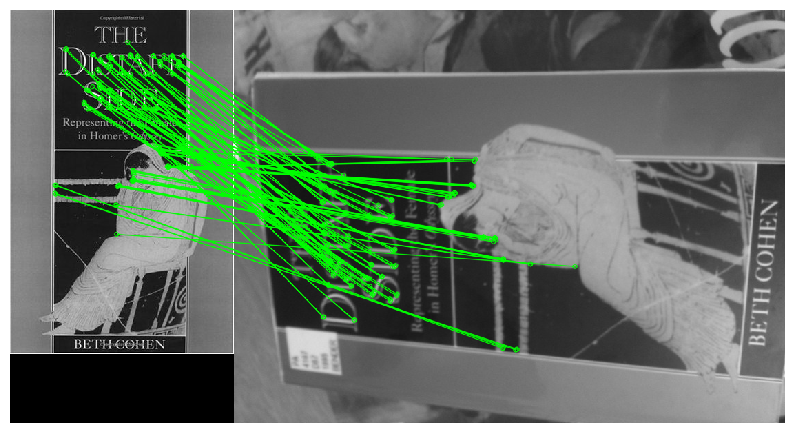


Threshold:  10.0
Number of inliers: 157


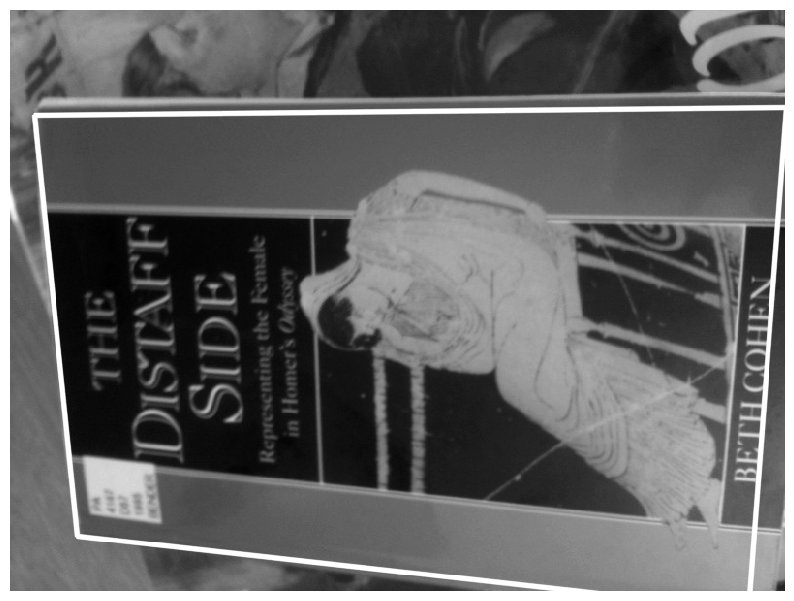

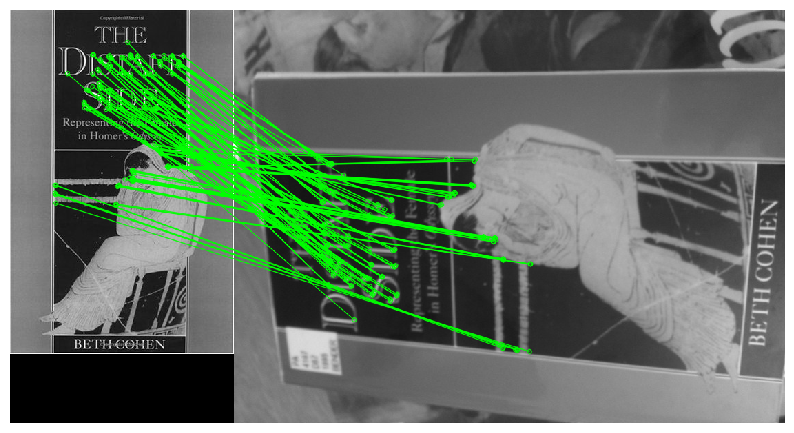


Threshold:  50.0
Number of inliers: 186


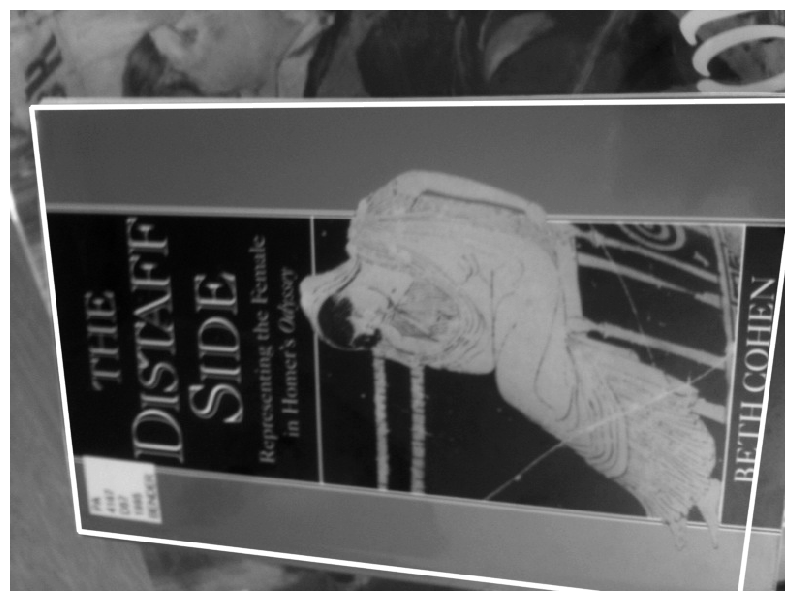

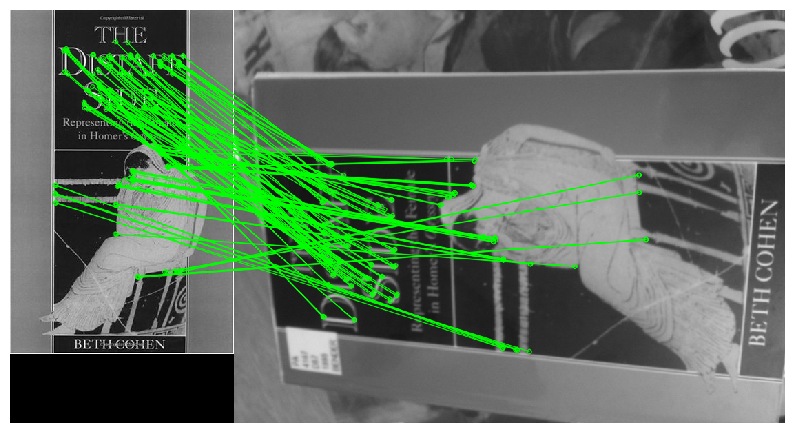


Threshold:  200.0
Number of inliers: 225


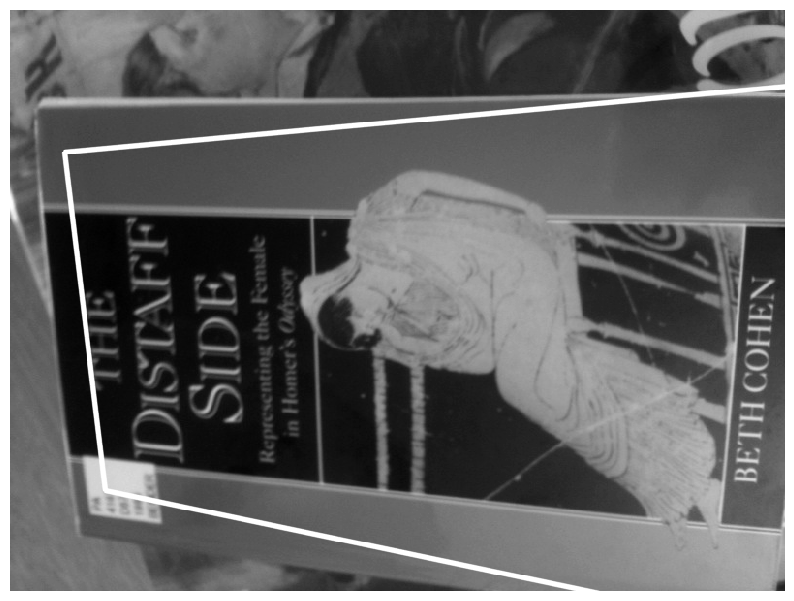

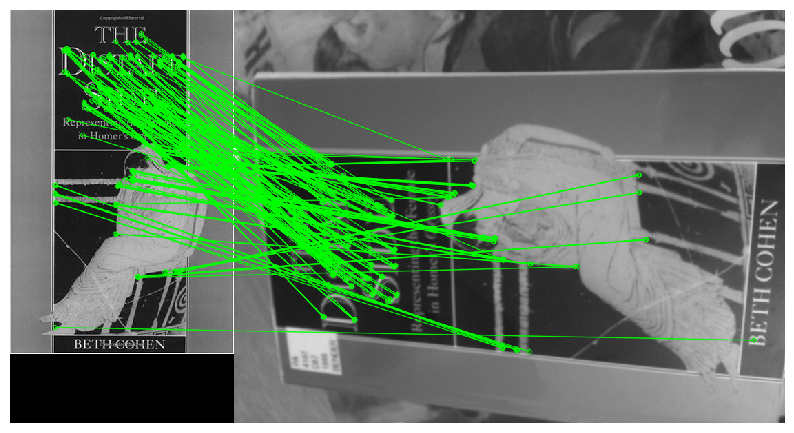


Threshold:  500.0
Number of inliers: 236


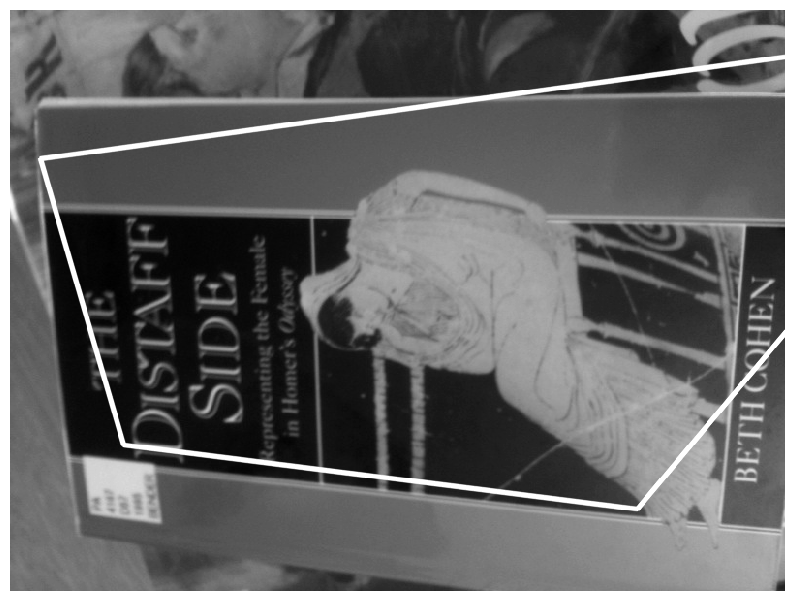

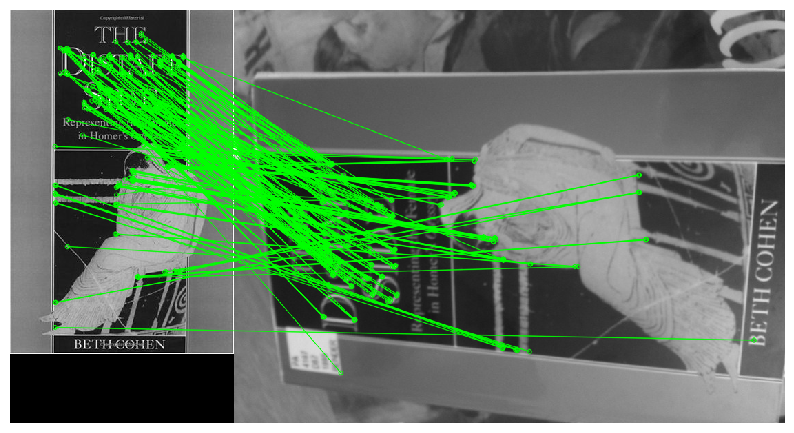


Threshold:  1000.0
Number of inliers: 242


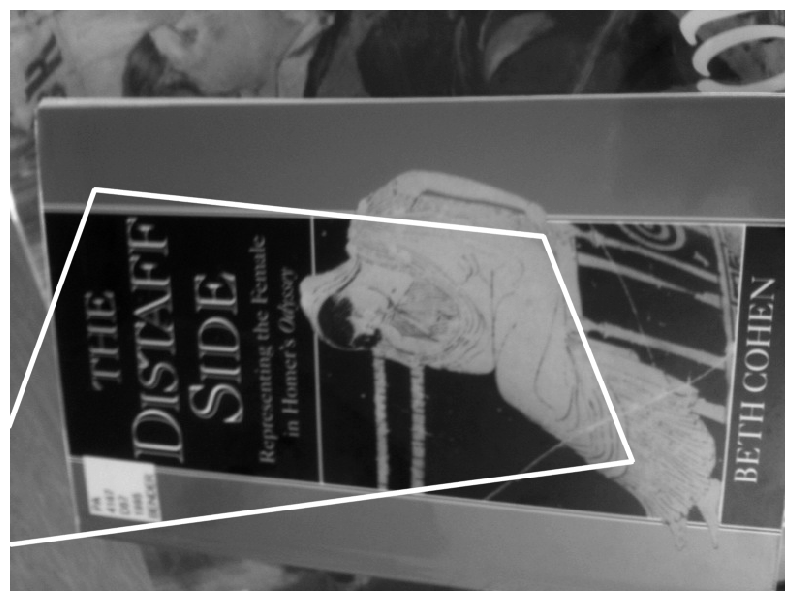

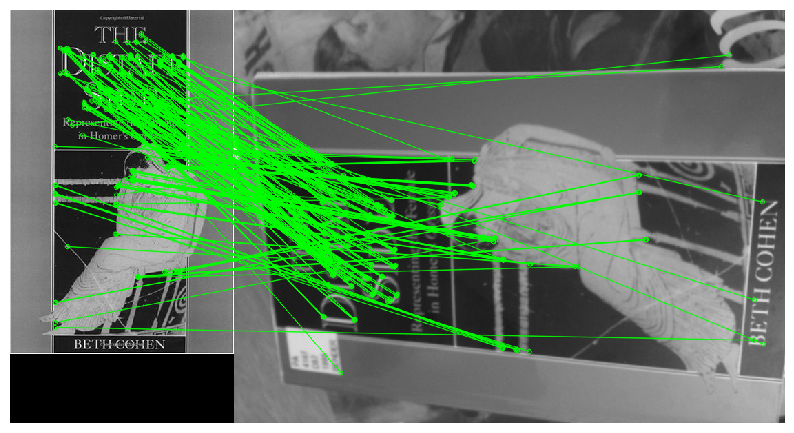

In [8]:
# Your code to display book location after RANSAC here
thresholds = [1.0, 5.0, 10.0, 50.0, 200.0, 500.0, 1000.0]

for threshold in thresholds:
    print("Threshold: ", threshold)
    
    # using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, threshold)

    
    # inlier number
    inliers = np.sum(mask)  # mask contains 1 for inliers, 0 for outliers
    print("Number of inliers:", inliers)


    # draw frame
    draw_outline(img1, img2, H)

    # draw inliers
    draw_inliers(img1, img2, kp1, kp2, good, mask)
    
    print()



***Your explanation of what you have tried, and results here***

Applying the RANSAC method, instantly produces a better result at a threshold of 1.0 with only 41 inliers, the book is very clearly and accurately outlined in the reference image, except for the base of the book which it incorrectly assumes the book cover ends at the author's name.

As the thresholds increase, there is not any noticable change in the outline until the threshold is increased to 200.0 at which point we start to see the outline of the book cover collapse inwards and shrink to be conatained within the cover instead of bordering it, this trend continues with eaach increase to the thresholds at both 500.0 and 1000.0, at which point the result is visually similar to the least squares method.

The results demonstrate that at too high thresholds and too many inliers, starting in these tests at >=200.0, the outline of the match in the reference image becomes significantly less accurate.

6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

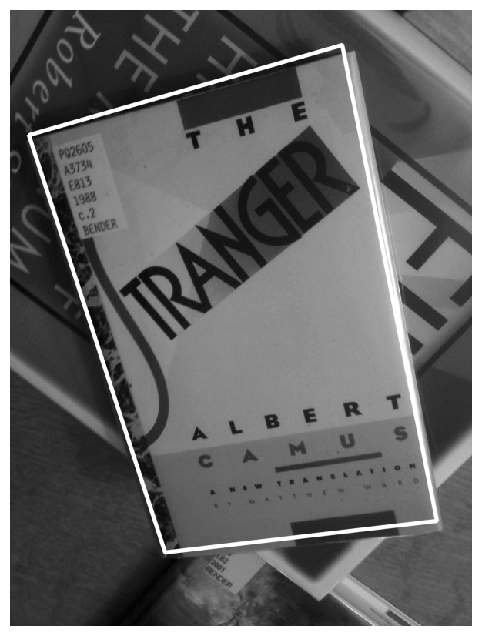

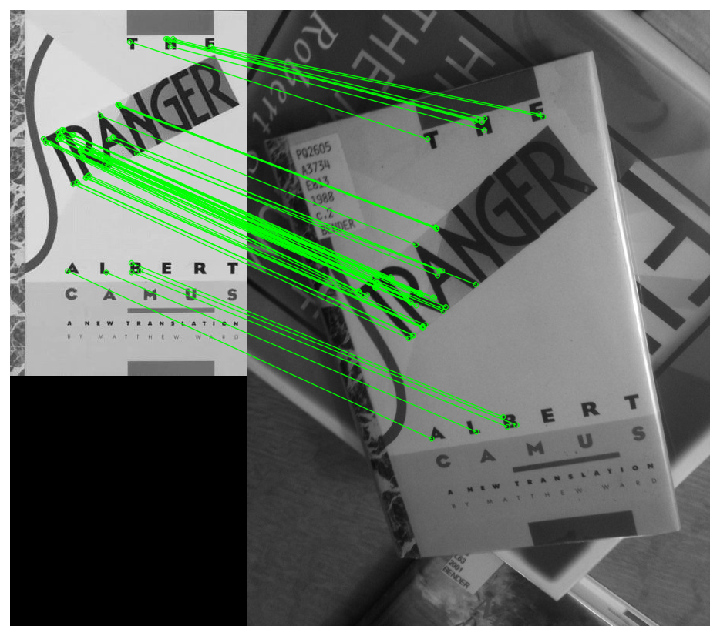

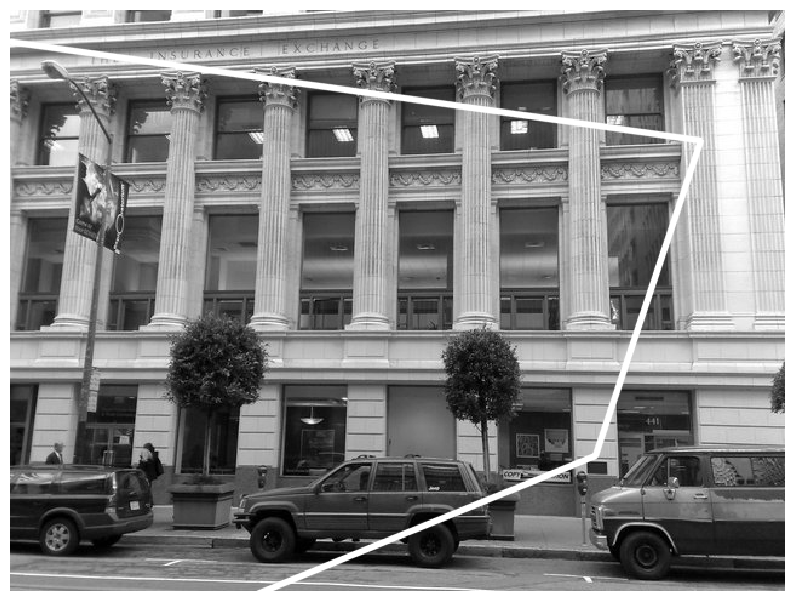

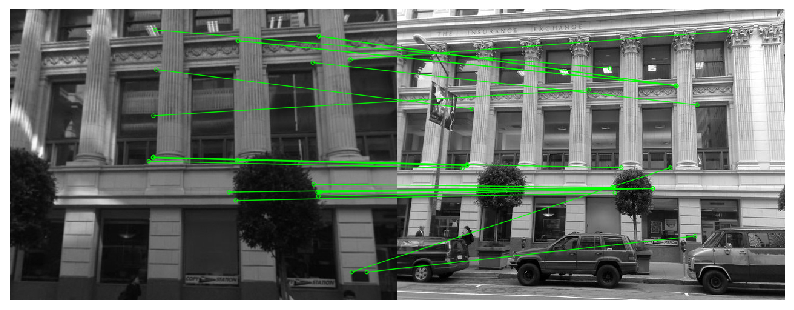

In [9]:

orb = cv2.ORB_create()

# Your results for other image pairs here

images = []

book_ref = cv2.imread('a2/A2_smvs/book_covers/Reference/017.jpg', 0)
book_query = cv2.imread('a2/A2_smvs/book_covers/Query/017.jpg', 0)
images.append((book_ref, book_query, 10.0))

landmark_ref = cv2.imread('a2/A2_smvs/landmarks/Reference/012.jpg', 0)
landmark_query = cv2.imread('a2/A2_smvs/landmarks/Query/012.jpg', 0)
images.append((landmark_ref, landmark_query, 200.0))

# plt.imshow(images[1][0], 'gray'), plt.axis('off'), plt.show()

for image in images:
    # compute detector and descriptor
    kp1 = orb.detect(image[0], None)
    kp1, des1 = orb.compute(image[0], kp1)

    kp2 = orb.detect(image[1], None)
    kp2, des2 = orb.compute(image[1], kp2)

    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

    # Match descriptors
    matches = bf.knnMatch(des1, des2, k=2)


    ratio = 0.8
    good = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good.append(m)

    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, image[2])

    
            
    # draw frame
    draw_outline(image[0], image[1], H)



    # draw inliers
    draw_inliers(image[0], image[1], kp1, kp2, good, mask)


***Your explanation of results here***

The book cover example of image 017 works well and successfully matches, the outline created around the book in the reference image is accurate at outlining the book cover identified from the query image. This book image was chosen from the dataset to attempt to get a successful match, as it is clear with well defined edges in the text appearing on the cover, and it is without much other detail other than these clear edges on the book cover itself, though it is on top of another book in the background which could have caused innacuracies.

The landscape image of image 012 did not match as well as the book, initially with the same threashold of 10 applied to it as with the book, the match was able to have some accurate inliers but a minimal amount, and the outline was entirely innacurate. However, increasing the threshold to 200.0 for this landscape resulted in greater success, the amount of inliers increased all seemingly accurate, also varied much more spatially in the image, resulting in a much more accurate outline compared to before. However, desptite this improvement, the outline still was not very accurate at all, noteably it is very innacurate at describing the rotationwhile the inliers all seem to appear accurate in the visualisation of the draw_inliers output image, the outline is entirely innaccurate and does not outline the query within the reference image, instead it does not border the query within the reference accurately, and it gets the shape of the outline wrong, however, it approximates the angle of rotation, as visualised in the difference between the slant of the pillars, somewhat accurately with the slant of the top of the outline.
This landscape was chosen as I hypothesised that it would not be as accurate as the book example, which was proven to be the case especially with the intial threshold of 10.0, and even still not very precise with the outline even at threshold of 200.0. The reason for failure seems to be potentially the difference in roation between the images, the difference in lighting apparent in the greyscale, and distracting objects like cars and people that vary between the images that may cause matching errors or obfuscate matching features blocked by these introduced objects. 



# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images.

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hint 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.-->


In [11]:
import a2code

# Your code to iddntify query objects and measure search accuracy for data set here
ref_images, ref_filenames = a2code.load_images("a2/A2_smvs/book_covers/Reference")
query_images, query_filenames = a2code.load_images("a2/A2_smvs/book_covers/Query")

orb = cv2.ORB_create()
ref_kp_des = a2code.compute_keypoints_and_descriptors(ref_images, orb)

match_ranks = []
for i, query_img in enumerate(query_images):

    kp2, des2 = orb.detectAndCompute(query_img, None)

    scores = []

    for j, (kp1, des1) in enumerate(ref_kp_des):
        H, inliers, good, mask = a2code.match_and_find_homography(kp1, des1, kp2, des2)
        scores.append((inliers, j))  # collect all scores

    # Sort by inliers descending
    scores.sort(reverse=True, key=lambda x: x[0])


    for j, score in enumerate(scores):
        if query_filenames[i] == ref_filenames[score[1]]:
            rank = j + 1
            
            print(f"Query {query_filenames[i]} matched reference {ref_filenames[scores[0][1]]}, {scores[0][0]} inliers; Correct ranked {rank}, {score[0]} inliers.")
            
            match_ranks.append(rank)
            

            break

print()

top_k_values = [1, 3, 5, 10]
for top_k in top_k_values:
    correct_matches = 0
    for rank in match_ranks:
        if rank <= top_k:
            correct_matches += 1
    
    accuracy = (correct_matches / len(query_images)) * 100
    print(f"Top-{top_k} accuracy: {accuracy:.2f}%")




Query 001.jpg matched reference 001.jpg, 100 inliers; Correct ranked 1, 100 inliers.
Query 002.jpg matched reference 002.jpg, 63 inliers; Correct ranked 1, 63 inliers.
Query 003.jpg matched reference 003.jpg, 94 inliers; Correct ranked 1, 94 inliers.
Query 004.jpg matched reference 004.jpg, 31 inliers; Correct ranked 1, 31 inliers.
Query 005.jpg matched reference 005.jpg, 52 inliers; Correct ranked 1, 52 inliers.
Query 006.jpg matched reference 006.jpg, 83 inliers; Correct ranked 1, 83 inliers.
Query 007.jpg matched reference 007.jpg, 46 inliers; Correct ranked 1, 46 inliers.
Query 008.jpg matched reference 008.jpg, 14 inliers; Correct ranked 1, 14 inliers.
Query 009.jpg matched reference 009.jpg, 63 inliers; Correct ranked 1, 63 inliers.
Query 010.jpg matched reference 010.jpg, 122 inliers; Correct ranked 1, 122 inliers.
Query 011.jpg matched reference 011.jpg, 84 inliers; Correct ranked 1, 84 inliers.
Query 012.jpg matched reference 012.jpg, 56 inliers; Correct ranked 1, 56 inliers.


***Your explanation of what you have done, and your results, here***

I was able to achieve a relatively accurate result with top-1 accuracy at 66.34%, this, as expected, increased as the top-k number increased, at top-10 matches it became 77.23% accurate. When a greater amount of inliers were detected in the rank 1 much, it was much more likely to be ranked 1, whereas matches with less inliers often had the correct match ranked lower.

It is clear that by increasing the top-k matches accepted as correct, the accuracy significantly increases, increasing with each increase to k:
- Top-1: 66.34%
- Top-3: 69.31%
- Top-5: 71.29%
- Top-10: 77.23%

5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [12]:
# Your code to run extra queries and display results here

import a2code

# Your code to iddntify query objects and measure search accuracy for data set here

inlier_threshold = 20


ref_images, ref_filenames = a2code.load_images("a2/A2_smvs/book_covers/Reference")
query_images, query_filenames = a2code.load_images("a2/A2_smvs/book_covers/Query")

extra_images, extra_filenames = a2code.load_images("a2/extra_queries")

orb = cv2.ORB_create()
ref_kp_des = a2code.compute_keypoints_and_descriptors(ref_images, orb)

match_ranks = []
for i, query_img in enumerate(query_images):
    
    kp2, des2 = orb.detectAndCompute(query_img, None)

    scores = []

    for j, (kp1, des1) in enumerate(ref_kp_des):
        H, inliers, good, mask = a2code.match_and_find_homography(kp1, des1, kp2, des2)
        scores.append((inliers, j))  # collect all scores

    # Sort by inliers descending
    scores.sort(reverse=True, key=lambda x: x[0])

    match_found = False
    for j, score in enumerate(scores):
        if score[0] >= inlier_threshold and query_filenames[i] == ref_filenames[score[1]]:
            rank = j + 1
            
            print(f"Query {query_filenames[i]} matched reference {ref_filenames[scores[0][1]]}, {scores[0][0]} inliers; Correct ranked {rank}, {score[0]} inliers.")
            correct_matches += 1
            
            match_ranks.append(rank)
            
            match_found = True
            break
    
    if not match_found:
        print(f"Query {query_filenames[i]} not found")

print()

extra_matches = 0
for i, query_img in enumerate(extra_images):
        
    kp2, des2 = orb.detectAndCompute(query_img, None)

    scores = []

    for j, (kp1, des1) in enumerate(ref_kp_des):
        H, inliers, good, mask = a2code.match_and_find_homography(kp1, des1, kp2, des2)
        scores.append((inliers, j))  # collect all scores

    # Sort by inliers descending
    scores.sort(reverse=True, key=lambda x: x[0])

    match_found = False
    if len(scores) > 0:
        for score in scores:
            if score[0] >= inlier_threshold:
                print(f"Query {extra_filenames[i]} matched reference {ref_filenames[scores[0][1]]}, {scores[0][0]} inliers.")
                
                extra_matches += 1
                match_found = True
                break
    
    if not match_found:
        print(f"Query {extra_filenames[i]} not found")
        
        match_ranks.append(-1) # correctly didnt find any match
    
print()
    
extra_accuracy = ((len(extra_images) - extra_matches) / len(extra_images)) * 100
print(f"Extra queries accuracy: {extra_accuracy:.2f}%")
print()

print("Total accuracies:")

top_k_values = [1, 3, 5, 10]
for top_k in top_k_values:
    correct_matches = 0
    for rank in match_ranks:
        if rank <= top_k:
            correct_matches += 1
    
    accuracy = (correct_matches / (len(query_images) + len(extra_images))) * 100
    print(f"Top-{top_k} accuracy: {accuracy:.2f}%")





Query 001.jpg matched reference 001.jpg, 100 inliers; Correct ranked 1, 100 inliers.
Query 002.jpg matched reference 002.jpg, 63 inliers; Correct ranked 1, 63 inliers.
Query 003.jpg matched reference 003.jpg, 94 inliers; Correct ranked 1, 94 inliers.
Query 004.jpg matched reference 004.jpg, 31 inliers; Correct ranked 1, 31 inliers.
Query 005.jpg matched reference 005.jpg, 52 inliers; Correct ranked 1, 52 inliers.
Query 006.jpg matched reference 006.jpg, 83 inliers; Correct ranked 1, 83 inliers.
Query 007.jpg matched reference 007.jpg, 46 inliers; Correct ranked 1, 46 inliers.
Query 008.jpg not found
Query 009.jpg matched reference 009.jpg, 63 inliers; Correct ranked 1, 63 inliers.
Query 010.jpg matched reference 010.jpg, 122 inliers; Correct ranked 1, 122 inliers.
Query 011.jpg matched reference 011.jpg, 84 inliers; Correct ranked 1, 84 inliers.
Query 012.jpg matched reference 012.jpg, 56 inliers; Correct ranked 1, 56 inliers.
Query 013.jpg matched reference 013.jpg, 54 inliers; Correc

***Your explanation of results and any changes made here***

---

Extra query images of book covers were chosen as these will best gauge accuracy compared to the reference dataset of book covers. The images are different angles, with different lighting and including backgrounds to be similar to the original query dataset.

A change I had to make was adding an inlier threshold such that a match was only accepted if it had an amount of inliers greater than the threshold, this was to be able to identify the extra images as not found. For consistency I had to apply the inlier threshold also to the original query images. I started with an inlier threshold of 10, this caused some of the original queries to find no match at all as the matches were below the inlier threshold, the extra queries accuracy was only 35.71% while the top-1 accuracy for all queries decreased from the original test to 61.74%. 

At a stricter inlier threshold of 15, the extra_images accuracy was greatly improved to 57.14% as more queries were rejected, however this had the consequence of decreasing overall top-1 accuracy to 57.39% as more correct matches were excluded.

With an even stricter inlier threshold of 20, the extra_images accuracy became 100%, while the total top-1 accuracy decreased by just less than one percentage point to 56.52%.

A stricter inlier threshold of 20 seems to be the best compromise allowing for accurately excluding queries with no reference image with 100% accuracy for the provided queries while the total accuracy being 56.52% is not much lower than 57.39% for inlier threshold of 15. With a better ratio between queries that occur in the reference dataset, and queries that do not occur in the references, this accuracy would be expected to improve significatly at the stricter inlier threshold of 20 that provides great accuracy for excluding queries that do not exist in the reference dataset.


6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


In [14]:
# Your code to search images and display results here

import a2code

# Your code to iddntify query objects and measure search accuracy for data set here
ref_images, ref_filenames = a2code.load_images("a2/A2_smvs/museum_paintings/Reference")
query_images, query_filenames = a2code.load_images("a2/A2_smvs/museum_paintings/Query")

orb = cv2.ORB_create()
ref_kp_des = a2code.compute_keypoints_and_descriptors(ref_images, orb)

match_ranks = []
for i, query_img in enumerate(query_images):

    kp2, des2 = orb.detectAndCompute(query_img, None)

    scores = []

    for j, (kp1, des1) in enumerate(ref_kp_des):
        H, inliers, good, mask = a2code.match_and_find_homography(kp1, des1, kp2, des2)
        scores.append((inliers, j))  # collect all scores

    # Sort by inliers descending
    scores.sort(reverse=True, key=lambda x: x[0])


    for j, score in enumerate(scores):
        if query_filenames[i] == ref_filenames[score[1]]:
            rank = j + 1
            
            print(f"Query {query_filenames[i]} matched reference {ref_filenames[scores[0][1]]}, {scores[0][0]} inliers; Correct ranked {rank}, {score[0]} inliers.")

            
            match_ranks.append(rank)
            
            break

print()

top_k_values = [1, 3, 5, 10]
for top_k in top_k_values:
    correct_matches = 0
    for rank in match_ranks:
        if rank <= top_k:
            correct_matches += 1
    
    accuracy = (correct_matches / len(query_images)) * 100
    print(f"Top-{top_k} accuracy: {accuracy:.2f}%")




Query 001.jpg matched reference 001.jpg, 48 inliers; Correct ranked 1, 48 inliers.
Query 002.jpg matched reference 047.jpg, 8 inliers; Correct ranked 4, 6 inliers.
Query 003.jpg matched reference 003.jpg, 12 inliers; Correct ranked 1, 12 inliers.
Query 004.jpg matched reference 079.jpg, 9 inliers; Correct ranked 2, 8 inliers.
Query 005.jpg matched reference 025.jpg, 7 inliers; Correct ranked 28, 4 inliers.
Query 006.jpg matched reference 006.jpg, 23 inliers; Correct ranked 1, 23 inliers.
Query 007.jpg matched reference 007.jpg, 74 inliers; Correct ranked 1, 74 inliers.
Query 008.jpg matched reference 008.jpg, 127 inliers; Correct ranked 1, 127 inliers.
Query 009.jpg matched reference 009.jpg, 14 inliers; Correct ranked 1, 14 inliers.
Query 010.jpg matched reference 010.jpg, 35 inliers; Correct ranked 1, 35 inliers.
Query 011.jpg matched reference 011.jpg, 29 inliers; Correct ranked 1, 29 inliers.
Query 012.jpg matched reference 012.jpg, 89 inliers; Correct ranked 1, 89 inliers.
Query 0

***Your description of what you have done, and explanation of results, here***

The paintings dataset results in a decreased accuracy for all tested top-k values compared to that of the book dataset, at top-1 it has 49.45% accuracy, top-3 is better at 56.04% accuracy which might be acceptable given the more difficult nature of matching the paintings to each other compared to the books.

Accepting the top-k matches based on their ranking with varying k numbers was chosen as the method to attempt to improve accuracy. This method was successful in significantly increasing accuracy as demonstrated in the results from 49.45% at top-1, to 61.54% at top-10 accuracy.

As the accuracy only increases to 58.24% at top-5, and 61.54% at top-10, top-3 or top-5 may be the best comporomise for their improved accuracy from top-1 but also more confident results than the top-10 option.

## Question 3: FUndametal Matrix, Epilines and Retrival (optional, assesed for granting up to 25% bonus marks for the A2)

In this question, the aim is to accuractely estimate the fundamental matrix given two views of a scene, visualise the corresponding epipolar lines and use the inlier count of fundametal matrix for retrival.

The steps are as follows:

1. Select two images of the same scene (query and reference) from the landmark dataset and find the matches as you have done in Question 1 (1.1-1.4).
2. Compute fundametal metrix with good matches (after appying ratio test) using the opencv function cv.findFundamentalMat(). Use both 8 point algorithm and RANSAC assisted 8 point algorithm to compute fundamental matrix.
 1. Hint: You need minimum 8 matches to be able to use the function. Ignore pairs where 8 mathes are not found.
3. Visualise the epipolar lines for the matched features and analyse the results. You can use openCV function cv.computeCorrespondEpilines() to estimate the epilines. We have provided the code for drawing these epilines in function drawlines() that you can modify as required.


In [ ]:
# Your code to find fundamental matrices with and without RANSAC goes here

In [ ]:
# Your code to visualise the epipolar lines for both cases for an example goes here

***Your visualization for epilines goes here***

---

4. Repeat the steps for some examples from the landmarks datasets.

In [ ]:
 # Your code for additional images goes here

***Your visualization for additional epillines goes here***

---

5. Find a query from landmarks data for which the retrival in Q2 failed. Attempt the retrival with replacing the Homography + RANSAC method of Q2 to Fundamental Matrix + RANSAC method using code written above.
Does the change of the model makes retraival successful? Analyse and comment.

In [ ]:
# Your code for retrival goes here

***Your analysis goes here***

---
